In [28]:
from camera import Camera
import matplotlib.pyplot as plt
from matplotlib.collections import PolyCollection, LineCollection
import numpy as np
import random
from tqdm import tqdm
import triangle_mesh as tm

In [2]:
mesh_folder = 'assets/'
mesh_name = 'PN_9_5'

In [15]:
spot = tm.TriangleMesh(mesh_folder + mesh_name + '.obj')
head = tm.TriangleMesh(mesh_folder + mesh_name + '_head.obj')
body = tm.TriangleMesh(mesh_folder + mesh_name + '_body.obj')
plane = tm.TriangleMesh(mesh_folder + mesh_name + '_plane.obj')

plane_y = plane.get_centroid()[1]
head.remove_faces(np.array([0, 1, 0]))
head.remove_faces(np.array([0, -1, 0]))
# head.remove_vertices(plane_y)
body.remove_faces(np.array([0, 1, 0]))
body.remove_faces(np.array([0, -1, 0]))
# body.remove_vertices(plane_y)

body.plot().show()

Number of faces after removing:  84326
Number of faces after removing:  83706
Number of faces after removing:  59430
Number of faces after removing:  57977


In [58]:
# boundary_lines_pairs, boundary_centroid = head.get_boundary_vertices(plane_y=plane_y)
# print(len(boundary_lines_pairs))
# 
# # plot boundary lines
# fig = plt.figure()
# ax = fig.add_subplot(111, projection='3d')
# for pair in boundary_lines_pairs:
#     ax.plot([pair[0][0], pair[1][0]], [pair[0][2], pair[1][2]], [pair[0][1], pair[1][1]], color='r')
# 
# # Tie the boundary lines to the centroid and plot
# for pair in boundary_lines_pairs:
#     ax.plot([pair[0][0], boundary_centroid[0]], [pair[0][2], boundary_centroid[2]], [pair[0][1], boundary_centroid[1]], color='b')
#     ax.plot([pair[1][0], boundary_centroid[0]], [pair[1][2], boundary_centroid[2]], [pair[1][1], boundary_centroid[1]], color='b')

In [17]:
head_cut = tm.TriangleMesh(mesh_folder + mesh_name + '_head.obj')
head_cut.print_stats()
head_cut.remove_faces(np.array([0, -1, 0]), sign=True)
head_cut.plot().show()

Number of vertices:  223920
Number of faces:  86892
Number of edges:  260676
Number of faces after removing:  620


In [18]:
separate = True
boundary_lines_pairs, boundary_centroid, is_inner = head.get_boundary_vertices(plane_y=plane_y, separate_inner=separate)
# build triangles from boundary lines
cut_meshes = []
if separate:
    for value in [False, True]:
        triangles = []
        for id, pair in enumerate(boundary_lines_pairs):
            if is_inner[id] == value:
                triangles.extend([pair[0], pair[1], boundary_centroid])
        
        cut_meshes.append(np.array(triangles))
else:
    triangles = []
    for pair in boundary_lines_pairs:
        triangles.extend([pair[0], pair[1], boundary_centroid])
    
    cut_meshes.append(np.array(triangles))

100%|██████████| 550/550 [00:22<00:00, 24.55it/s]
C:\Users\AlfonsoLópezRuiz\AppData\Local\Temp\ipykernel_12256\2953423979.py:38: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('Greys', 2)


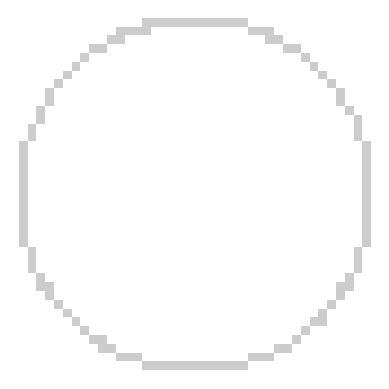

In [57]:
class Grid:
    def __init__(self, res_x, res_y, min_x, max_x, min_y, max_y):
        self.res_x = res_x
        self.res_y = res_y
        self.min_x = min_x
        self.max_x = max_x
        self.min_y = min_y
        self.max_y = max_y

        self.x_step = (max_x - min_x) / res_x
        self.y_step = (max_y - min_y) / res_y

        self.grid = np.zeros((res_x, res_y))

    def insert_point(self, x, z):
        x = int((x - self.min_x) / self.x_step)
        y = int((z - self.min_y) / self.y_step)
        if 0 <= x < self.res_x and 0 <= y < self.res_y:
            self.grid[x, y] = 1
            
    def xor(self, grid):
        if self.res_x != grid.res_x or self.res_y != grid.res_y:
            raise Exception('Grids must have the same resolution')
        self.grid = np.logical_xor(self.grid, grid.grid)
        
    def plot(self):
        # expand grid by one
        grid = np.pad(self.grid, 1, 'constant', constant_values=0)
        
        # Plot as a 2d grid
        fig = plt.figure()
        ax = fig.add_subplot(111)
        
        # disable axis
        ax.set_axis_off()
        
        # elaborate cmap with alpha = 0.1 for zero values
        cmap = plt.cm.get_cmap('Greys', 2)
        cmap._init()
        alphas = np.linspace(0, 0.8, cmap.N+3)
        cmap._lut[:,-1] = alphas
        
        # plot
        ax.imshow(grid, cmap=cmap, interpolation='nearest')
        fig.savefig('results/grid.png', dpi=500, transparent=True)
   
aabb = head_cut.get_aabb()
# Sample triangles if they exist
# for sample in tqdm(head_cut.sample(100000)):
#     grid.insert_point(sample[0], sample[2])
    
# Another way: sample triangles from cut meshes and insert points
grids, samples = [], []
num_samples = 10000

for sample in range(num_samples):
    s = random.random()
    t = random.random()
    in_triangle = s + t <= 1
    if not in_triangle:
        s = 1 - s
        t = 1 - t
    samples.append([s, t])
            
for mesh in cut_meshes:
    triangles = mesh
    grid = Grid(40, 40, aabb[0][0], aabb[1][0], aabb[0][2], aabb[1][2]) 
    
    for triangles_idx in tqdm(range(0, len(triangles), 3)):
        u, v = np.array(triangles[triangles_idx + 1]) - np.array(triangles[triangles_idx]), triangles[triangles_idx + 2] - np.array(triangles[triangles_idx])
        for sample in samples:
            p = sample[0] * u + sample[1] * v
            grid.insert_point(p[0], p[2])
        
    grids.append(grid)

grids[0].xor(grids[1])

#grid.plot()
grids[0].plot()

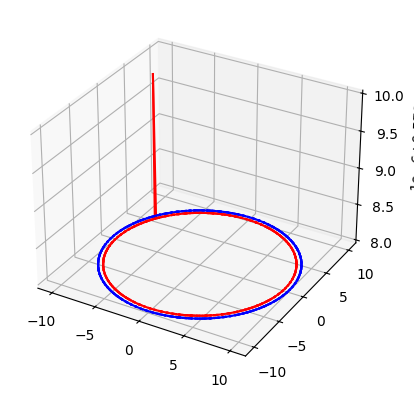

In [19]:
# plot lines with inner == True
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
for id, pair in enumerate(boundary_lines_pairs):
    if is_inner[id]:
        ax.plot([pair[0][0], pair[1][0]], [pair[0][2], pair[1][2]], [pair[0][1], pair[1][1]], color='r')
    else:
        ax.plot([pair[0][0], pair[1][0]], [pair[0][2], pair[1][2]], [pair[0][1], pair[1][1]], color='b')

In [59]:
MVP = Camera.perspective(14, 1, 1, 100) @ Camera.translate(-0.4, -10, -100) @ Camera.x_rotate(-20) @ Camera.y_rotate(-70)
#MVP = Camera.perspective(12, 1, 1, 100) @ Camera.translate(-0.4, -0.4, -15) @ Camera.x_rotate(-20) @ Camera.y_rotate(-50)

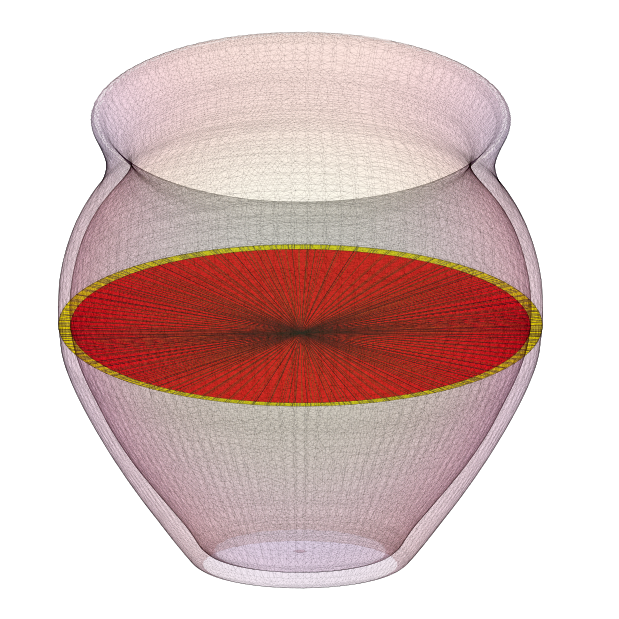

In [65]:
meshes = [head, body]

fig = plt.figure(figsize=(6, 6))
ax = fig.add_axes([0, 0, 1, 1], xlim=[-1, +1], ylim=[-1, +1], aspect=1, frameon=False)

# plot cut
for idx, cut_mesh in enumerate(cut_meshes):
    triangles, colors = tm.TriangleMesh.get_projected_triangles(faces=cut_mesh, projection_matrix=MVP)
    face_color = 'yellow' if idx == 0 else 'red'
    collection = PolyCollection(triangles, closed=True, linewidth=0.1, facecolor=face_color, edgecolor="black", alpha=1)
    ax.add_collection(collection)

for mesh in meshes:
    triangles, colors = mesh.get_projected_triangles_(projection_matrix=MVP)
    collection = PolyCollection(triangles, closed=True, linewidth=0.15, facecolor=colors, edgecolor="black", alpha=0.1)
    ax.add_collection(collection)

plt.axis("off")
plt.savefig("results/vessel_split.png", dpi=300)
plt.show()